## imports

In [1]:
import geopandas as gpd
import numpy as np
import pygmt

# loading data & converting between formats

In [2]:
# load kmz data into geopandas
gdf = gpd.read_file("dikes.kmz", driver="LIBKML") # lots of other drivers available (pretty much any format you can think of)

# convert to geojson (or a different format if you prefer)
gdf.to_file("dikes.geojson", driver="GeoJSON") # save to another format, can be easily opened in QGIS, arcGIS, etc.

In [3]:
gdf.head()

,Name,description,timestamp,begin,end,altitudeMode,tessellate,extrude,visibility,drawOrder,icon,snippet,geometry
0,,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",NaT,NaT,NaT,clampToGround,-1,0,-1,NaN,None,,"MULTILINESTRING Z ((-117.35356 45.16548 0, -11..."
1,,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",NaT,NaT,NaT,clampToGround,-1,0,-1,NaN,None,,"MULTILINESTRING Z ((-117.33297 45.19037 0, -11..."
2,,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",NaT,NaT,NaT,clampToGround,-1,0,-1,NaN,None,,"MULTILINESTRING Z ((-117.45262 45.2495 0, -117..."
3,,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",NaT,NaT,NaT,clampToGround,-1,0,-1,NaN,None,,"MULTILINESTRING Z ((-117.49793 45.21125 0, -11..."
4,,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",NaT,NaT,NaT,clampToGround,-1,0,-1,NaN,None,,"MULTILINESTRING Z ((-117.43169 45.21971 0, -11..."


# projections

In [11]:
# extract the projection
# gdf.to_crs(epsg=26713, inplace=True) # convert to 26713
print(f'CRS: {gdf.crs}')

# get bounding box based on the extent of the data
west, south, east, north = gdf.total_bounds # minx, miny, maxx, maxy

# round the values to 2 decimal places
west, south, east, north = np.round([west, south, east, north], 2)

# convert to WESN for pygmt
bbox = np.array([west, east, south, north])

print(bbox)

CRS: EPSG:4326
[-119.5  -115.53   43.6    47.37]


In [5]:
# set map width
mapwidth = 10

# calc the center of the map with np
clon, clat = np.mean([east, west]), np.mean([north, south])

# Albers conic equal area projection
proj = f'B{clon}/{clat}/{north}/{south}/{mapwidth}c' # B<lon_0>/<lat_0>/<lat_1>/<lat_2>/<width>

print(proj)

B-117.515/45.485/47.37/43.6/10c


# basic plot with geopandas

- not publication quality, but simple and closer to matplotlib-esque plotting for simple/prelim data exploration

<Axes: >

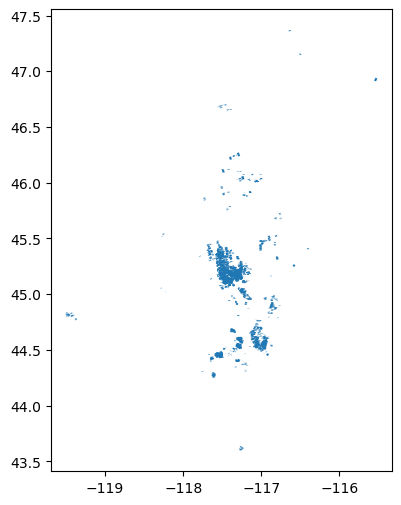

In [6]:
# plot with geopandas
gdf.plot(figsize=(6, 6))

# plotting with pygmt

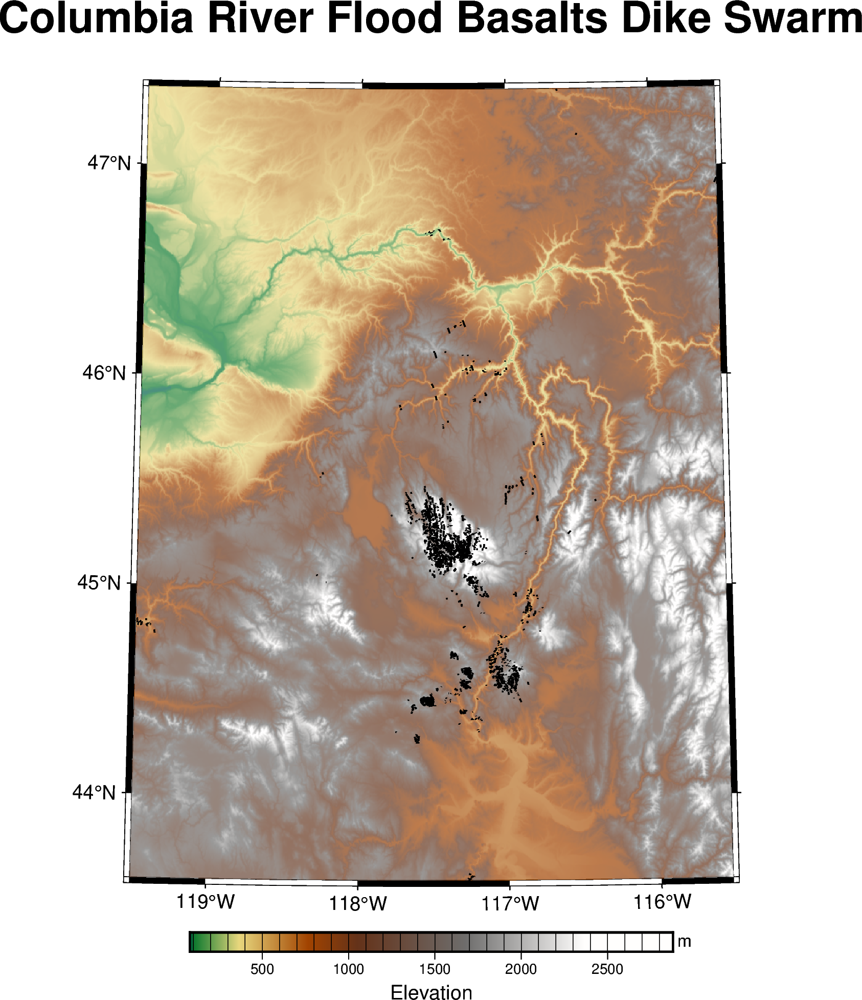

In [7]:
# plot the data
fig = pygmt.Figure()
fig.basemap(
    region=bbox,
    projection=proj,
    # projection="X10c/5c",
    frame=["a", "+tColumbia River Flood Basalts Dike Swarm"],
)
fig.grdimage("@earth_relief_15s", cmap="geo", transparency=30)
fig.plot(data=gdf, pen="0.75p") # pass the geopandas dataframe in directly
fig.colorbar(frame=["a500g100", "x+lElevation", "y+lm"])
fig.show()

In [8]:
# explore data interactively
gdf.explore()

# convert to a new coordinate system

In [9]:
gdf_new = gdf.to_crs(epsg=3857)

# plotting a heatmap of the data

In [10]:
import folium

from folium import plugins

map = folium.Map(location=[clat, clon], tiles="Cartodb dark_matter", zoom_start=7)

# convert lines into points (center of the line) and make new geodataframe
gdf_points = gdf.copy()
gdf_points["geometry"] = gdf_points["geometry"].centroid

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in gdf_points.geometry]

heat_data
plugins.HeatMap(heat_data).add_to(map)

map

/var/folders/kx/_4y_qnz528xckbxwtfngwfh80000gn/T/ipykernel_70914/1611215275.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_points["geometry"] = gdf_points["geometry"].centroid
